In [1]:
!pip3 install numpy==1.17.4

import numpy as np
import pandas as pd 
from tqdm import tqdm
import json

from matplotlib import image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import cv2

!pip install fastai --upgrade

import torch 
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms

from fastai.vision.all import *


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 50.0 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [2937 lines of output]
      Running from numpy source directory.
      blas_opt_info:
      blas_mkl_info:
      customize UnixCCompiler
        FOUND:
          libraries = ['mkl_rt', 'pthread']
          library_dirs = ['/opt/conda/lib']
          define_macros = [('SCIPY_MKL_H', None), ('HAVE_CBLAS', None)]
          include_dirs = ['/usr/local/include', '/usr/include', '/opt/conda/include']
      
        FOUND:
          libraries = ['mkl_rt', 'pthread']
          library_dirs = ['/opt/conda/lib']
          define_macros = [('SCIPY_MKL_H', None), ('HAVE_CBLAS', None)]
          include_dirs = ['/usr/local/include', '/usr/include', '/opt/conda/include']
      
      /bin/sh: 1: svnversion: not found
      non-existing path in 'numpy/

In [5]:
with open("/kaggle/input/dls-project/export/_annotations.coco.json") as f:
    annotations = json.load(f)
    
category_dict = {}
for cat in annotations['categories']:
    category_dict[cat['id']] = cat['name']
category_dict

{0: 'obstacles',
 1: 'biker',
 2: 'car',
 3: 'pedestrian',
 4: 'trafficLight',
 5: 'trafficLight-Green',
 6: 'trafficLight-GreenLeft',
 7: 'trafficLight-Red',
 8: 'trafficLight-RedLeft',
 9: 'trafficLight-Yellow',
 10: 'trafficLight-YellowLeft',
 11: 'truck'}

In [6]:
image_dir = "/kaggle/input/dls-project/export"
annotation_file = "/kaggle/input/dls-project/export/_annotations.coco.json"

uint8
(512, 512, 3)


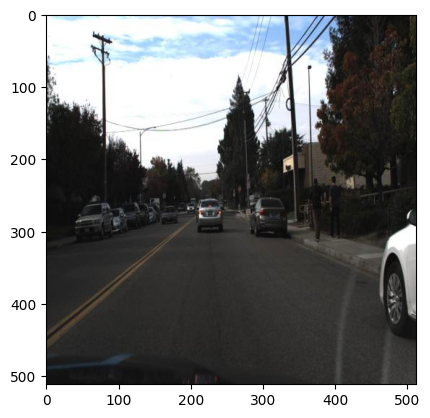

In [7]:
plt_image = image.imread(f'{image_dir}/1478897255713873932_jpg.rf.gboKysygWMebUx0uXVEx.jpg')

print(plt_image.dtype)
print(plt_image.shape)

fig, ax = plt.subplots()

ax.imshow(plt_image)

plt.show()

In [8]:
class SelfDrivingCarDataset(torch.utils.data.Dataset):  
    def __init__(self, images_path, std=False):
        super(SelfDrivingCarDataset, self).__init__()
        self.images_path = glob.glob(images_path + "/*.jpg")
        self.std = std
        with open(images_path + '_annotations.coco.json', 'r') as f:
            self.annotations = json.load(f)
        
    def __len__(self):
        return len(self.images_path)  

    def __getitem__(self, idx):
        file_path = self.images_path[idx]
        file_name = file_path.split("/")[-1]  # Get the actual filename
        img_id = None

        # Find the image ID corresponding to the filename
        for img_info in self.annotations['images']:
            if img_info['file_name'] == file_name:
                img_id = img_info['id']
                break

        if img_id is None:
            print(f"No image ID found for file: {file_name}")
            return None, None

        # Collect annotations for the image
        bbox, areas, iscrowd, labels = [], [], [], []
        for box in self.annotations['annotations']:
            if box['image_id'] == img_id:
                bbox.append(box['bbox'])
                areas.append(box['area'])
                iscrowd.append(box['iscrowd'])
                labels.append(box['category_id'])
        
        # Read and process the image
        img = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        
        # Convert bounding boxes from [x, y, w, h] to [x_min, y_min, x_max, y_max]
        if len(bbox) > 0:
            bbox = np.array(bbox)
            bbox[:, 2] = bbox[:, 0] + bbox[:, 2]
            bbox[:, 3] = bbox[:, 1] + bbox[:, 3]
            bbox = torch.as_tensor(bbox, dtype=torch.float32)
        else:
            bbox = torch.zeros((0, 4), dtype=torch.float32)
        
        if self.std:
            img = img / 255.0  # Normalize to [0, 1]

        # Prepare target dictionary
        target = {}
        target["boxes"] = bbox
        target["labels"] = torch.tensor(labels, dtype=torch.int64)
        target["area"] = torch.as_tensor(areas, dtype=torch.float32)
        target["iscrowd"] = torch.tensor(iscrowd, dtype=torch.int64)
        target["image_id"] = torch.tensor([idx])

        # Convert image to torch tensor
        img = torch.from_numpy(img).permute(2, 0, 1)  # [H, W, C] -> [C, H, W]

        return img, target

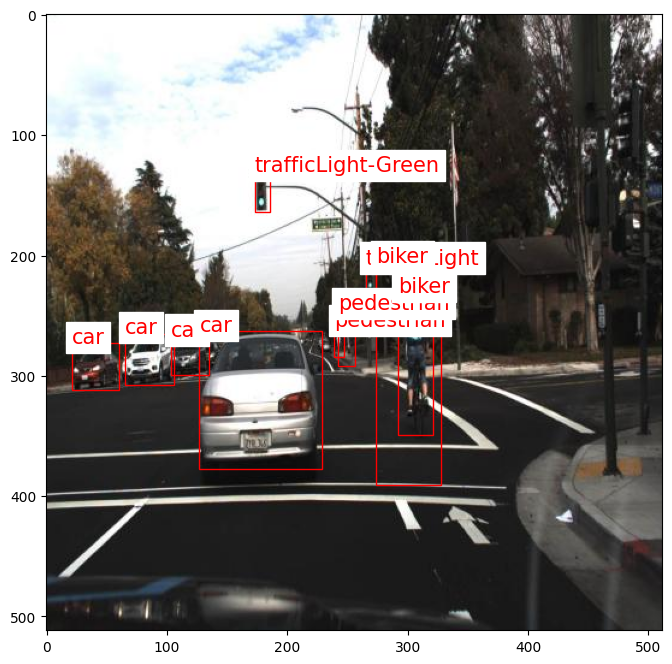

In [9]:
def visualize_sample(img, target, category_dict):
    img = img.permute(1, 2, 0).numpy().astype(np.uint8)  # [C, H, W] -> [H, W, C]
    if len(target['boxes']) == 0:
        print("No bounding boxes to display.")
        return

    fig, ax = plt.subplots(figsize=(16, 8))
    ax.imshow(img)

    for lab, lab_name in zip(target['boxes'], target["labels"]):
        rect = patches.Rectangle(
            (lab[0], lab[1]), lab[2] - lab[0], lab[3] - lab[1], 
            linewidth=1, edgecolor='r', facecolor='none'
        )
        ax.annotate(
            category_dict[int(lab_name)], (lab[0], lab[1]), 
            color='red', fontsize=15, backgroundcolor="w"
        )
        ax.add_patch(rect)

    plt.show()

dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/")
img, target = dataset.__getitem__(402)

if img is not None and target is not None:
    visualize_sample(img, target, category_dict)

In [10]:
print(f"Image shape: {img.shape}, dtype: {img.dtype}")
print(f"Bounding boxes: {target['boxes']}")
print(f"Labels: {target['labels']}")

Image shape: torch.Size([3, 512, 512]), dtype: torch.float32
Bounding boxes: tensor([[ 21.0000, 273.0000,  60.5000, 311.5000],
        [ 65.0000, 265.0000, 105.5000, 307.5000],
        [103.0000, 267.0000, 135.0000, 299.5000],
        [127.0000, 263.0000, 229.0000, 377.5000],
        [173.0000, 130.0000, 185.5000, 164.0000],
        [239.0000, 259.0000, 247.5000, 284.5000],
        [242.0000, 245.0000, 256.5000, 292.0000],
        [265.0000, 207.0000, 274.0000, 235.0000],
        [274.0000, 206.0000, 328.0000, 390.5000],
        [292.0000, 231.0000, 321.0000, 349.0000]])
Labels: tensor([2, 2, 2, 2, 5, 3, 3, 4, 1, 1])


In [11]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)
val_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)
test_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)

In [12]:
# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()
train_dataset = torch.utils.data.Subset(train_dataset, indices[:18800])
val_dataset = torch.utils.data.Subset(val_dataset, indices[18800:23800])
test_dataset = torch.utils.data.Subset(test_dataset, indices[23800:])

# define training and validation data loaders
train_dataloader = torch.utils.data.DataLoader(
        train_dataset, batch_size=4, shuffle=True, num_workers=0,
        collate_fn = collate_fn)

val_dataloader = torch.utils.data.DataLoader(
        val_dataset, batch_size=4, shuffle=False, num_workers=0,
        collate_fn = collate_fn)

test_dataloader = torch.utils.data.DataLoader(
        test_dataset, batch_size=1, shuffle=False, num_workers=0,
        collate_fn = collate_fn)

In [14]:
if(torch.cuda.is_available()):
    device = torch.device("cuda")
    print("Device:", device, torch.cuda.get_device_name(0))
else:
    device= torch.device("cpu")
    print("Device:", device)

Device: cuda Tesla P100-PCIE-16GB


In [15]:
%%sh
if [ ! -d "output/vision" ]; then
    git clone https://github.com/pytorch/vision.git output/vision
else
    echo "output/vision already cloned"
fi

cp output/vision/references/detection/utils.py .
cp output/vision/references/detection/transforms.py .
cp output/vision/references/detection/coco_eval.py .
cp output/vision/references/detection/engine.py .
cp output/vision/references/detection/coco_utils.py .

Cloning into 'output/vision'...


In [16]:
%%capture
!pip3 install pycocotools
!pip3 install -U scikit-image
!pip3 install -U cython 

### Model Training

import torchvision
num_classes = 12
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
fasterRCNN_model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
in_features = fasterRCNN_model.roi_heads.box_predictor.cls_score.in_features
fasterRCNN_model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes=num_classes)
fasterRCNN_model = fasterRCNN_model.float() 

class LossAverager:
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

from engine import train_one_epoch, evaluate
import time

loss_hist = LossAverager()

EPOCHS = 12

fasterRCNN_model.float()
fasterRCNN_model.to(device)

params = [p for p in fasterRCNN_model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.00005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                   step_size=3,
                                                   gamma=0.1)

for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1}/{EPOCHS}")
    tick = time.time()
    fasterRCNN_model.train()
    loss_hist.reset()
    
    for images, targets in tqdm(train_dataloader):
        
        images = torch.stack(images).to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        bs = images.shape[0]    
        loss_dict = fasterRCNN_model(images, targets)
    
        totalLoss = sum(loss for loss in loss_dict.values())
        lossValue = totalLoss.item()
        loss_hist.update(lossValue, bs)

        optimizer.zero_grad()
        totalLoss.backward()
        optimizer.step()
        lr_scheduler.step(totalLoss)
        
    print(f"Train loss: {loss_hist.avg}")
    loss_hist.reset()
    
    for images, targets in val_dataloader:
        images = torch.stack(images).to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        loss_dict = fasterRCNN_model(images, targets)
        totalLoss = sum(loss for loss in loss_dict.values())
        lossValue = totalLoss.item()
        loss_hist.update(lossValue,bs)
        
    print(f"Val loss: {loss_hist.avg}")

### Loading Trained Model

In [17]:
import torchvision.models.detection as detection
num_classes = 12
fasterRCNN_model = detection.fasterrcnn_resnet50_fpn(weights=None, num_classes=num_classes)
checkpoint = torch.load("/kaggle/input/fasterrcnn-model/faster_rcnn_model_updated.pth", 
                        map_location=torch.device('cpu'))

# Check the type of the checkpoint
if isinstance(checkpoint, dict):
    # If it's a dictionary, try to load the state dict
    state_dict = checkpoint.get('model_state_dict', checkpoint)
else:
    # If it's not a dictionary, try to get its state dict
    state_dict = checkpoint.state_dict()

try:
    # Try to load the state dictionary into the model
    fasterRCNN_model.load_state_dict(state_dict)
except RuntimeError as e:
    print("Error loading state dict. Possible causes:")
    print("1. Mismatch in model architecture")
    print("2. Incorrect number of classes")
    print("3. Incompatible state dict format")
    raise e

# Set the model to evaluation mode
fasterRCNN_model.eval()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 220MB/s]
/tmp/ipykernel_23/1660118588.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [18]:
def sample_prediction():
    fasterRCNN_model.eval()
    cpu = torch.device("cpu")
    fasterRCNN_model.to(cpu)
    sample_image = test_dataset.__getitem__(200)[0]
    groundtruth_boxes = test_dataset.__getitem__(200)[1]["boxes"]
    sample_image = torch.unsqueeze(sample_image, 0)
    sample_image.to(cpu)
    outputs = fasterRCNN_model(sample_image)
    outputs = [{k: v for k, v in t.items()} for t in outputs]
    boxes = outputs[0]["boxes"].detach().numpy()
    scores = outputs[0]["scores"].detach().numpy()
    labels = outputs[0]["labels"].detach().numpy()
    sample_image = sample_image.reshape(
        sample_image.shape[2],sample_image.shape[3], 3)
    return sample_image, boxes, scores, labels, groundtruth_boxes

sample_image, boxes, scores, labels, groundtruth_boxes = sample_prediction()

In [19]:
def nms():
    """NMS iteratively removes lower scoring boxes which have an IoU 
    greater than iou_threshold with another (higher scoring) box.
    """
    iou = 0.99
    iou_threshold = 1 - iou
    NMS = torchvision.ops.nms(torch.tensor(boxes), torch.tensor(scores), iou_threshold)
    best_boxes, best_scores, best_labels = [], [], []
    for nms in NMS:
        best_boxes.append(boxes[nms])
        best_scores.append(scores[nms])
        best_labels.append(labels[nms])
    return best_boxes, best_scores, best_labels

best_boxes, best_scores, best_labels = nms()

In [20]:
best_boxes

[array([204.6725 , 259.051  , 221.40718, 280.1625 ], dtype=float32),
 array([149.53502, 259.45795, 178.79404, 294.3501 ], dtype=float32),
 array([417.3634 , 208.8073 , 442.99142, 307.14105], dtype=float32)]

In [21]:
def sample_prediction(threshold=0.5):
    """
    Generate predictions for a single test image.

    Args:
        threshold (float): Confidence threshold to filter predictions.

    Returns:
        sample_image (numpy array): The input image.
        filtered_boxes (numpy array): Predicted bounding boxes after applying the threshold.
        filtered_scores (numpy array): Confidence scores of the predictions.
        filtered_labels (numpy array): Labels of the predicted objects.
        groundtruth_boxes (tensor): Ground truth bounding boxes.
    """
    fasterRCNN_model.eval()
    cpu = torch.device("cpu")
    fasterRCNN_model.to(cpu)
    
    # Select a sample image
    sample_image, groundtruth = test_dataset.__getitem__(200)
    groundtruth_boxes = groundtruth["boxes"]
    
    # Preprocess the image for prediction
    sample_image = torch.unsqueeze(sample_image, 0)  # Add batch dimension
    sample_image = sample_image.to(cpu)
    
    # Perform prediction
    with torch.no_grad():
        outputs = fasterRCNN_model(sample_image)
    
    # Extract outputs
    outputs = [{k: v for k, v in t.items()} for t in outputs]
    boxes = outputs[0]["boxes"].detach().numpy()
    scores = outputs[0]["scores"].detach().numpy()
    labels = outputs[0]["labels"].detach().numpy()
    
    # Filter predictions based on the threshold
    mask = scores >= threshold
    filtered_boxes = boxes[mask]
    filtered_scores = scores[mask]
    filtered_labels = labels[mask]
    
    # Reshape the image for visualization
    sample_image = sample_image.squeeze(0).permute(1, 2, 0).numpy()
    
    return sample_image, filtered_boxes, filtered_scores, filtered_labels, groundtruth_boxes


In [22]:
sample_image, boxes, scores, labels, groundtruth_boxes = sample_prediction(threshold=0.5)

print("Predicted Boxes:", boxes)
print("Confidence Scores:", scores)
print("Labels:", labels)
print("Ground Truth Boxes:", groundtruth_boxes)

Predicted Boxes: [[204.6725  259.051   221.40718 280.1625 ]
 [149.53502 259.45795 178.79404 294.3501 ]
 [417.3634  208.8073  442.99142 307.14105]
 [422.58704 198.9333  465.19397 355.88562]]
Confidence Scores: [0.9999541  0.99989593 0.9965773  0.9748473 ]
Labels: [2 2 3 3]
Ground Truth Boxes: tensor([[413.0000, 204.0000, 435.4000, 308.5333],
        [436.0000, 246.0000, 467.7333, 350.9600],
        [153.0000, 258.0000, 182.3333, 292.1333],
        [204.0000, 259.0000, 220.5333, 280.3333]])


In [23]:
def retrieve_test_predictions(model, test_dataloader, device, threshold=0.5):
    """
    Retrieve predictions for all test images.

    Args:
        model (torch.nn.Module): Trained Faster R-CNN model.
        test_dataloader (DataLoader): DataLoader for the test dataset.
        device (torch.device): Device to run the predictions (CPU or GPU).
        threshold (float): Confidence threshold to filter predictions.

    Returns:
        predictions (list): List of dictionaries containing predictions for each image.
        ground_truths (list): List of ground truth data for each image.
    """
    model.eval()
    model.to(device)
    predictions = []
    ground_truths = []

    with torch.no_grad():
        for images, targets in test_dataloader:
            images = [img.to(device) for img in images]
            outputs = model(images)

            # Process each image in the batch
            for i in range(len(images)):
                output = outputs[i]
                ground_truth = targets[i]

                # Extract predictions
                boxes = output["boxes"].detach().cpu().numpy()
                scores = output["scores"].detach().cpu().numpy()
                labels = output["labels"].detach().cpu().numpy()

                # Apply threshold to filter predictions
                mask = scores >= threshold
                filtered_boxes = boxes[mask]
                filtered_scores = scores[mask]
                filtered_labels = labels[mask]

                # Store predictions and ground truths
                predictions.append({
                    "boxes": filtered_boxes,
                    "scores": filtered_scores,
                    "labels": filtered_labels
                })
                ground_truths.append({
                    "boxes": ground_truth["boxes"].cpu().numpy(),
                    "labels": ground_truth["labels"].cpu().numpy()
                })

    return predictions, ground_truths

In [24]:
# Define device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Retrieve predictions for all test images
test_predictions, test_ground_truths = retrieve_test_predictions(fasterRCNN_model, test_dataloader, device, threshold=0.5)

# Example: Access predictions for the first test image
print("Predictions for first test image:")
print("Boxes:", test_predictions[0]["boxes"])
print("Scores:", test_predictions[0]["scores"])
print("Labels:", test_predictions[0]["labels"])

print("\nGround Truth for first test image:")
print("Boxes:", test_ground_truths[0]["boxes"])
print("Labels:", test_ground_truths[0]["labels"])

Predictions for first test image:
Boxes: [[  5.357246 155.27701  256.47995  474.24615 ]
 [235.77623  252.7769   316.35428  317.55997 ]
 [313.12152  247.4051   413.18762  310.77264 ]
 [415.72845  253.95857  483.51877  291.60455 ]
 [240.31638  194.7719   251.03494  231.59103 ]]
Scores: [0.99991643 0.9998925  0.9998852  0.9998615  0.99725777]
Labels: [2 2 2 2 7]

Ground Truth for first test image:
Boxes: [[312.  249.  415.5 311. ]
 [  4.  160.  259.  465.5]
 [236.  252.  318.5 317. ]
 [240.  196.  250.5 232. ]
 [415.  253.  484.  291.5]]
Labels: [2 2 2 7 2]


def visualize_predictions(image, predictions, ground_truths):
    """
    Visualize predictions and ground truths on an image.

    Args:
        image (numpy array): Input image.
        predictions (dict): Predicted bounding boxes, scores, and labels.
        ground_truths (dict): Ground truth bounding boxes and labels.
    """
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image.astype("uint8"))

    # Draw predicted boxes
    for box in predictions["boxes"]:
        x1, y1, x2, y2 = box
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    # Draw ground truth boxes
    for box in ground_truths["boxes"]:
        x1, y1, x2, y2 = box
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='g', facecolor='none', linestyle="--")
        ax.add_patch(rect)

    plt.show()

In [ ]:
def calculate_iou(box1, box2):
    """
    Calculate IoU (Intersection over Union) for two bounding boxes.

    Args:
        box1 (array): [x1, y1, x2, y2] for the first box.
        box2 (array): [x1, y1, x2, y2] for the second box.

    Returns:
        float: IoU value (0.0 to 1.0).
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Compute the area of intersection
    intersection = max(0, x2 - x1) * max(0, y2 - y1)

    # Compute the area of both boxes
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the union area
    union = box1_area + box2_area - intersection

    if union == 0:
        return 0.0

    return intersection / union


In [ ]:
from sklearn.metrics import average_precision_score
import numpy as np

def calculate_map(predictions, ground_truths, iou_threshold=0.5, num_classes=3):
    """
    Calculate mean Average Precision (mAP) for object detection.

    Args:
        predictions (list): List of dictionaries with predicted boxes, scores, and labels.
        ground_truths (list): List of dictionaries with ground truth boxes and labels.
        iou_threshold (float): IoU threshold for a valid prediction.
        num_classes (int): Number of classes in the dataset.

    Returns:
        float: mAP score.
    """
    ap_per_class = []

    for class_id in range(1, num_classes + 1):  # Assuming class IDs are 1-based
        true_positives = []
        scores = []
        num_gt = 0

        for pred, gt in zip(predictions, ground_truths):
            gt_boxes = gt["boxes"][gt["labels"] == class_id]
            pred_boxes = pred["boxes"][pred["labels"] == class_id]
            pred_scores = pred["scores"][pred["labels"] == class_id]

            num_gt += len(gt_boxes)
            matched_gt = set()

            # Sort predictions by scores (descending)
            sorted_indices = np.argsort(-pred_scores)
            pred_boxes = pred_boxes[sorted_indices]
            pred_scores = pred_scores[sorted_indices]

            for i, pred_box in enumerate(pred_boxes):
                best_iou = 0.0
                best_gt_idx = -1

                for gt_idx, gt_box in enumerate(gt_boxes):
                    if gt_idx in matched_gt:
                        continue
                    iou = calculate_iou(pred_box, gt_box)
                    if iou > best_iou:
                        best_iou = iou
                        best_gt_idx = gt_idx

                if best_iou >= iou_threshold and best_gt_idx not in matched_gt:
                    true_positives.append(1)
                    matched_gt.add(best_gt_idx)
                else:
                    true_positives.append(0)

                scores.append(pred_scores[i])

        # Compute precision-recall curve
        if num_gt > 0:
            true_positives = np.array(true_positives)
            scores = np.array(scores)
            indices = np.argsort(-scores)
            true_positives = true_positives[indices]
            scores = scores[indices]

            cumulative_tp = np.cumsum(true_positives)
            cumulative_fp = np.cumsum(1 - true_positives)

            precision = cumulative_tp / (cumulative_tp + cumulative_fp)
            recall = cumulative_tp / num_gt

            # Compute Average Precision (AP) for this class
            ap = np.trapz(precision, recall)
            ap_per_class.append(ap)

    # Return mean Average Precision
    return np.mean(ap_per_class)


In [ ]:
# Calculate mAP
mean_ap = calculate_map(test_predictions, test_ground_truths, iou_threshold=0.5, num_classes=3)
print(f"mAP: {mean_ap:.4f}")

In [ ]:
# Calculate mAP
mean_ap = calculate_map(test_predictions, test_ground_truths, iou_threshold=0.5, num_classes=12)
print(f"mAP: {mean_ap:.4f}")

images_list = []
outputs_list = []
for batch_idx, (images, targets) in enumerate(test_dataloader):
    if batch_idx >= 10:  # Stop after 10 batches
            break
    images = [img.to(device) for img in images]
    outputs = fasterRCNN_model(images)
    images_list.append(images)
    outputs_list.append(outputs)

import torch
import matplotlib.pyplot as plt
for image in images_list:
    img_np = image[0].cpu().permute(1, 2, 0).numpy()
    plt.imshow(img_np)
    plt.axis('off') 
    plt.show()

In [ ]:
import numpy as np

def calculate_iof_dataset(test_predictions_dataset, test_ground_truth_dataset):
    """
    Calculate Intersection-over-Foreground (IOF) for all images in the dataset.

    Parameters:
        detected_boxes_dataset (list of list of tuples): List of detected bounding boxes for each image.
        ground_truth_boxes_dataset (list of list of tuples): List of ground truth bounding boxes for each image.

    Returns:
        list: IOF values for all detected boxes across the dataset.
    """
    all_iof_values = []
    test_predictions_boxes_dataset = [test_prediction['boxes'] for test_prediction in test_predictions_dataset]
    test_ground_truth_boxes_dataset = [test_ground_truth['boxes'] for test_ground_truth in test_ground_truth_dataset]

    for detected_boxes, ground_truth_boxes in zip(test_predictions_boxes_dataset, test_ground_truth_boxes_dataset):
        iof_values = []

        for det_box in detected_boxes:
            x1_det, y1_det, x2_det, y2_det = det_box
            det_area = (x2_det - x1_det) * (y2_det - y1_det)

            max_iof = 0
            for gt_box in ground_truth_boxes:
                x1_gt, y1_gt, x2_gt, y2_gt = gt_box

                # Calculate intersection
                inter_x1 = max(x1_det, x1_gt)
                inter_y1 = max(y1_det, y1_gt)
                inter_x2 = min(x2_det, x2_gt)
                inter_y2 = min(y2_det, y2_gt)

                if inter_x1 < inter_x2 and inter_y1 < inter_y2:
                    intersection_area = (inter_x2 - inter_x1) * (inter_y2 - inter_y1)
                    iof = intersection_area / det_area
                    max_iof = max(max_iof, iof)

            iof_values.append(max_iof)

        all_iof_values.extend(iof_values)

    return all_iof_values

In [ ]:
iof_values_fasterrcnn = calculate_iof_dataset(test_predictions, test_ground_truths)

plt.figure(figsize=(6, 4))
plt.hist(iof_values_fasterrcnn)
plt.title("IOF Distribution for Faster R CNN")
plt.xlabel("IOF")
plt.ylabel("Values")
plt.show()

In [ ]:
features = {}  # A dictionary to store the outputs of hooked layers

def get_activation(name):
    """
    Hook function to save intermediate layer outputs.
    """
    def hook(model, input, output):
        features[name] = output.detach()
    return hook

import torchvision.models.detection as detection

# Load Faster R-CNN model
# model = detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Register hooks for specific layers
fasterRCNN_model.backbone.body.layer4.register_forward_hook(get_activation("backbone_layer4"))
fasterRCNN_model.roi_heads.box_head.fc7.register_forward_hook(get_activation("roi_head_fc7"))

In [ ]:
import torch
from torchvision.transforms import functional as F
from PIL import Image

# Load and preprocess an example image
# image_path = test_dataset.__getitem__(200)  # Replace with your image path
image = test_dataset.__getitem__(200)[0] #Image.open(image_path).convert("RGB")
image_tensor = image.unsqueeze(0)  # Add batch dimension

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
fasterRCNN_model = fasterRCNN_model.to(device)
image_tensor = image_tensor.to(device)
fasterRCNN_model.eval()
with torch.no_grad():
    predictions = fasterRCNN_model(image_tensor)

# Access extracted features
backbone_features = features["backbone_layer4"]
roi_head_features = features["roi_head_fc7"]

print("Backbone features shape:", backbone_features.shape)
print("ROI head features shape:", roi_head_features.shape)

In [ ]:
import matplotlib.pyplot as plt

def visualize_feature_map(feature_map, num_channels=8):
    """
    Visualize a subset of feature map channels.
    
    Parameters:
        feature_map (torch.Tensor): The feature map tensor (e.g., [batch, channels, height, width]).
        num_channels (int): Number of channels to visualize.
    """
    feature_map = feature_map.squeeze(0)  # Remove batch dimension
    num_channels = min(num_channels, feature_map.shape[0])  # Limit to available channels
    
    plt.figure(figsize=(15, 15))
    for i in range(num_channels):
        plt.subplot(1, num_channels, i + 1)
        plt.imshow(feature_map[i].cpu().numpy(), cmap="viridis")
        plt.axis("off")
        plt.title(f"Channel {i+1}")
    plt.show()

# Visualize backbone features
visualize_feature_map(backbone_features)

In [ ]:
import matplotlib.pyplot as plt

def visualize_with_original(original_image, feature_map, num_channels=8):
    """
    Visualize original image and feature map channels side by side.
    
    Parameters:
        original_image: The input image tensor (batch_size, C, H, W) or (C, H, W)
        feature_map: The feature map tensor (e.g., [batch, channels, height, width])
        num_channels: Number of channels to visualize
    """
    # If the image tensor has a batch dimension, take the first image
    if original_image.dim() == 4:  # [batch_size, C, H, W]
        original_image = original_image[0]

    # Convert the original image tensor to numpy for visualization (C, H, W) -> (H, W, C)
    original_image = original_image.cpu().permute(1, 2, 0).numpy()  # Convert from CxHxW to HxWxC

    feature_map = feature_map.squeeze(0)  # Remove batch dimension
    num_channels = min(num_channels, feature_map.shape[0])
    
    plt.figure(figsize=(20, 4))
    
    # Plot original image
    plt.subplot(1, num_channels + 1, 1)
    plt.imshow(original_image)
    plt.axis("off")
    plt.title("Original Image")
    
    # Plot feature maps
    for i in range(num_channels):
        plt.subplot(1, num_channels + 1, i + 2)
        plt.imshow(feature_map[i].cpu().numpy(), cmap="viridis")
        plt.axis("off")
        plt.title(f"Channel {i+1}")
    
    plt.tight_layout()
    plt.show()

# Example usage:
visualize_with_original(image_tensor, backbone_features)


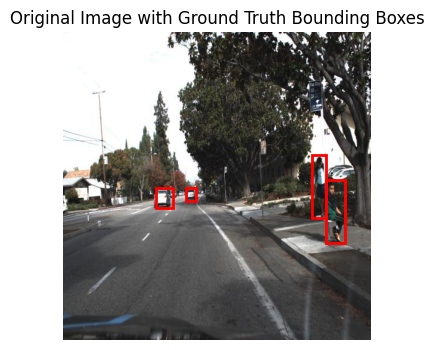

In [25]:
# boxes, scores, labels, groundtruth_boxes

import matplotlib.pyplot as plt
import matplotlib.patches as patches

def draw_bounding_boxes(image, boxes, box_type, box_color='r', box_thickness=2):
    fig, ax = plt.subplots(1, figsize=(20, 4))
    ax.imshow(image)
    ax.axis("off")
    for box in boxes:
        x_min, y_min, x_max, y_max = box
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 linewidth=box_thickness, edgecolor=box_color, facecolor='none')
        ax.add_patch(rect)
    plt.title(f"Original Image with {box_type} Bounding Boxes")
    plt.show()

# sample_image_np = sample_image.cpu().permute(1, 2, 0).numpy()  # Convert from CxHxW to HxWxC
draw_bounding_boxes(sample_image, groundtruth_boxes, 'Ground Truth')

In [ ]:
draw_bounding_boxes(sample_image, boxes, 'Predicted')

# sample_image.cpu().permute(1, 2, 0).numpy()

plt.figure(figsize=(20, 4))

plt.imshow(sample_image)
plt.axis("off")
plt.title("Original Image")

In [26]:
!pip install captum

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.1 MB/s eta 0:00:0000:01


In [27]:
fasterRCNN_model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [28]:
from captum.attr import LayerGradCam
def visualize_grad_cam_with_overlay(model, input_image):
    # Move input to the same device as model
    device = next(model.parameters()).device
    input_image = input_image.to(device)
    
    plt.figure(figsize=(15, 5))
    
    # Plot original image
    plt.subplot(1, 3, 1)
    original_img = input_image.cpu().permute(1, 2, 0).numpy()
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis('off')
    
    def wrapper_forward(input_tensor):
        with torch.enable_grad():
            output = model(input_tensor)
            if isinstance(output, list):
                scores = output[0]['scores']
            else:
                scores = output['scores']
            if len(scores.shape) == 1:
                scores = scores.unsqueeze(0)
            return scores
    
    # Define Grad-CAM for backbone layer
    layer_gc = LayerGradCam(wrapper_forward, model.backbone.body.layer4[2])
    
    # Generate Grad-CAM heatmap
    model.eval()
    for param in model.parameters():
        param.requires_grad = True
        
    with torch.enable_grad():
        output = wrapper_forward(input_image.unsqueeze(0))
        target_idx = output.argmax().item()
        attributions_gc = layer_gc.attribute(input_image.unsqueeze(0), target=target_idx)
    
    # Get heatmap
    heatmap = attributions_gc.squeeze().cpu().detach().numpy()
    if len(heatmap.shape) > 2:
        heatmap = np.mean(heatmap, axis=0)
    
    # Resize heatmap to match input image size
    heatmap = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))
    
    # Normalize heatmap
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
    # heatmap = 1 - heatmap
    
    # Plot Grad-CAM heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.colorbar()
    plt.title("Grad-CAM Heatmap")
    plt.axis('off')
    
    # Create overlay
    plt.subplot(1, 3, 3)
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    overlay = (heatmap_colored * 0.4 + original_img * 255 * 0.6).astype(np.uint8)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

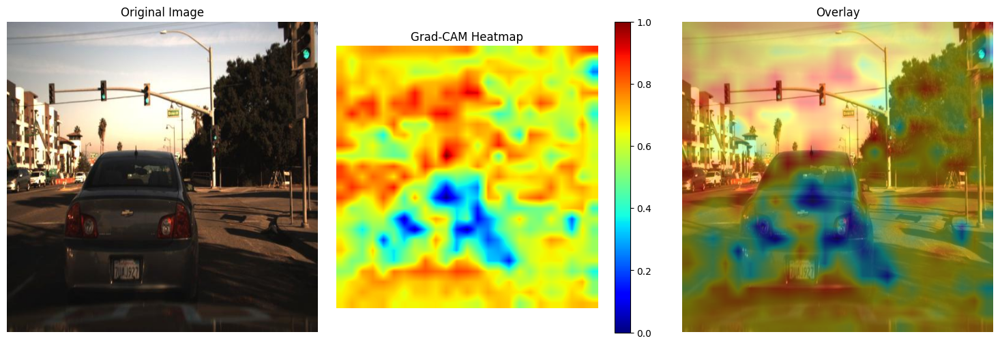

In [24]:
index_num = 1000
sample_image, groundtruth = test_dataset.__getitem__(index_num)
sample_image = torch.unsqueeze(sample_image, 0)  # Add batch dimension
sample_image = sample_image.to(device)
sample_image = sample_image.squeeze(0).cpu().permute(1, 2, 0).numpy()#sample_image.squeeze(0).permute(1, 2, 0).numpy()
groundtruth_boxes = test_dataset.__getitem__(index_num)[1]["boxes"]
boxes = test_predictions[index_num]['boxes']
image = test_dataset.__getitem__(index_num)[0] #Image.open(image_path).convert("RGB")
image_tensor = image.unsqueeze(0)

visualize_grad_cam_with_overlay(fasterRCNN_model, image_tensor[0])

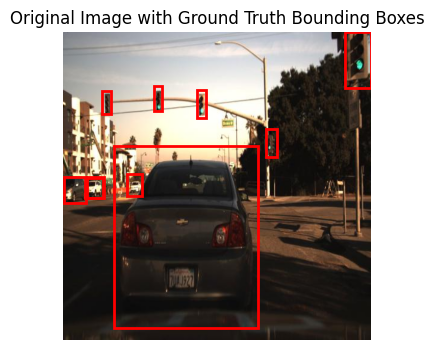

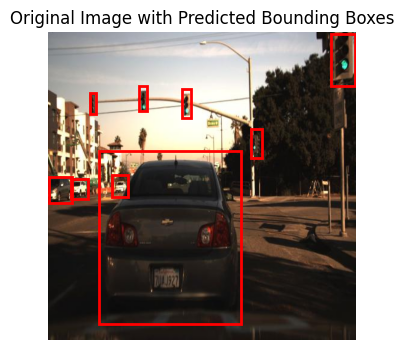

In [27]:
draw_bounding_boxes(sample_image, groundtruth_boxes, 'Ground Truth')
draw_bounding_boxes(sample_image, boxes, 'Predicted')

device = next(fasterRCNN_model.parameters()).device
input_image = image_tensor[0]
input_image = input_image.to(device)
plt.figure(figsize=(16, 8))
original_img = input_image.cpu().permute(1, 2, 0).numpy()
plt.imshow(original_img)
plt.title("Original Image")
plt.axis('off')

def sample_image_prediction(model, dataset, index_num):
    model.eval()
    cpu = torch.device("cpu")
    model.to(cpu)
    sample_image = dataset.__getitem__(index_num)[0]
    groundtruth_boxes = dataset.__getitem__(index_num)[1]["boxes"]
    sample_image = torch.unsqueeze(sample_image, 0)
    sample_image.to(cpu)
    outputs = model(sample_image)
    outputs = [{k: v for k, v in t.items()} for t in outputs]
    boxes = outputs[0]["boxes"].detach().numpy()
    scores = outputs[0]["scores"].detach().numpy()
    labels = outputs[0]["labels"].detach().numpy()
    sample_image = sample_image.reshape(
        sample_image.shape[2],sample_image.shape[3], 3)
    return sample_image, boxes, scores, labels, groundtruth_boxes

def nms(boxes, scores, labels):
    """NMS iteratively removes lower scoring boxes which have an IoU 
    greater than iou_threshold with another (higher scoring) box.
    """
    iou = 0.99
    iou_threshold = 1 - iou
    NMS = torchvision.ops.nms(torch.tensor(boxes), torch.tensor(scores), iou_threshold)
    best_boxes, best_scores, best_labels = [], [], []
    for nms in NMS:
        best_boxes.append(boxes[nms])
        best_scores.append(scores[nms])
        best_labels.append(labels[nms])
    return best_boxes, best_scores, best_labels

sample_image, boxes, scores, labels, groundtruth_boxes = sample_image_prediction(fasterRCNN_model, test_dataset, index_num)
best_boxes, best_scores, best_labels = nms(boxes, scores, labels)
print(best_boxes)
print(best_scores) 
print(best_labels)

print(boxes)
print(scores) 
print(labels)

index_num

def visualize_predicted_sample_image(img, predictions_dict, category_dict, label_type):
    # Convert the tensor to a NumPy array
    img = img.permute(1, 2, 0).cpu().numpy()
    
    # Rescale the pixel values to [0, 255]
    img = (img * 255).astype(np.uint8)
    
    if len(predictions_dict['boxes']) == 0:
        print("No bounding boxes to display.")
        return
    
    fig, ax = plt.subplots(figsize=(16, 8))
    ax.imshow(img)
    
    for lab, lab_name in zip(predictions_dict['boxes'], predictions_dict["labels"]):
        rect = patches.Rectangle(
            (lab[0], lab[1]), lab[2] - lab[0], lab[3] - lab[1], 
            linewidth=1, edgecolor='r', facecolor='none'
        )
        ax.annotate(
            category_dict[int(lab_name)], (lab[0], lab[1]), 
            color='red', fontsize=15, backgroundcolor="w"
        )
        ax.add_patch(rect)

    plt.title(f'{label_type} Labels with Bounding Boxes')
    plt.show()

visualize_predicted_sample_image(test_dataset.__getitem__(index_num)[0], test_predictions[index_num], category_dict, 'Predicted')

visualize_predicted_sample_image(test_dataset.__getitem__(index_num)[0], test_ground_truths[index_num], category_dict, 'Ground Truth')

In [ ]:
visualize_grad_cam_with_overlay(fasterRCNN_model, image_tensor[0])

import numpy as np
import cv2
import matplotlib.pyplot as plt

def compute_gradcam(image, model, target_idx, device):
    model.zero_grad()
    # Move image to the same device as the model
    image = image.to(device)
    outputs = model(image.unsqueeze(0))
    score = outputs[0]['scores'][target_idx]
    score.backward()
    # Get gradients and activations
    gradients = model.backbone.get_layer_gradients(image)
    activations = model.backbone.get_layer_activations(image)
    weights = gradients.mean(axis=(2, 3), keepdims=True)
    gradcam = (weights * activations).sum(axis=1)
    return F.relu(gradcam)


def overlay_gradcam_on_image(original_image, gradcam_map, alpha=0.5):
    gradcam_map = np.maximum(gradcam_map, 0)  # Remove negative values
    gradcam_map = gradcam_map / gradcam_map.max()  # Normalize to [0, 1]
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_map), cv2.COLORMAP_JET)
    original_image = np.array(original_image, dtype=np.uint8)
    heatmap = cv2.resize(heatmap, (original_image.shape[1], original_image.shape[0]))
    combined_image = cv2.addWeighted(original_image, 1 - alpha, heatmap, alpha, 0)
    return combined_image

def explain_predictions(model, images, image_index_num, target_idx):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    image, _ = images[image_index_num]
    # Move image to the same device
    image = image.to(device)
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = np.clip(image_np, 0, 1)
    gradcam_map = compute_gradcam(image, model, target_idx, device)
    gradcam_map = np.squeeze(gradcam_map.cpu().detach().numpy())
    combined_image = overlay_gradcam_on_image(image_np, gradcam_map, alpha=0.5)
    
    plt.imshow(gradcam_map, cmap='jet')
    plt.colorbar()
    plt.show()
    plt.imshow(combined_image)
    plt.colorbar()
    plt.show()
    return image_np, gradcam_map

In [31]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Global variables to store activations and gradients
activations = None
gradients = None

# Forward hook to capture activations
def forward_hook(module, input, output):
    global activations
    activations = output

# Backward hook to capture gradients
def backward_hook(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

# Register hooks on the desired layer
def register_hooks(model):
    target_layer = model.backbone.body["layer4"]  # Example: last layer of ResNet in the backbone
    target_layer.register_forward_hook(forward_hook)
    target_layer.register_backward_hook(backward_hook)

# Grad-CAM computation
def compute_gradcam(image, model, target_idx, device):
    global activations, gradients
    model.zero_grad()
    image = image.to(device)
    outputs = model([image])  # Pass as a list
    score = outputs[0]['scores'][target_idx]
    score.backward()
    # Compute Grad-CAM
    weights = gradients.mean(dim=(2, 3), keepdim=True)
    gradcam = (weights * activations).sum(dim=1).squeeze()
    return F.relu(gradcam).cpu().detach().numpy()

# Overlay Grad-CAM on image
def overlay_gradcam_on_image(original_image, gradcam_map, alpha=0.5):
    gradcam_map = np.maximum(gradcam_map, 0)  # Remove negative values
    gradcam_map = gradcam_map / gradcam_map.max()  # Normalize to [0, 1]
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_map), cv2.COLORMAP_JET)
    original_image = np.array(original_image, dtype=np.uint8)
    heatmap = cv2.resize(heatmap, (original_image.shape[1], original_image.shape[0]))
    combined_image = cv2.addWeighted(original_image, 1 - alpha, heatmap, alpha, 0)
    return combined_image

# Explain predictions
def explain_predictions(model, images, image_index, target_idx):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    register_hooks(model)
    image, _ = images[image_index]
    image = image.to(device)
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = np.clip(image_np, 0, 1)
    gradcam_map = compute_gradcam(image, model, target_idx, device)
    combined_image = overlay_gradcam_on_image(image_np, gradcam_map, alpha=0.5)
    
    plt.imshow(gradcam_map, cmap='jet')
    plt.colorbar()
    plt.show()
    plt.imshow(combined_image)
    plt.show()
    return image_np, gradcam_map


/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


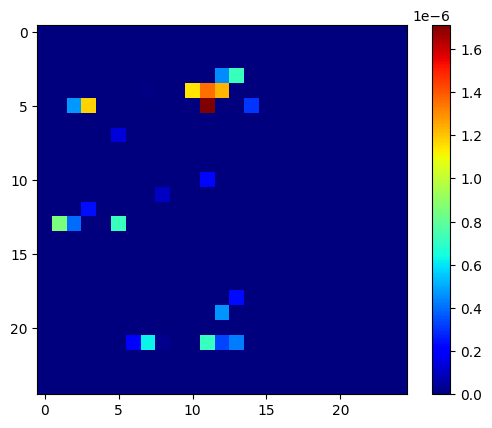

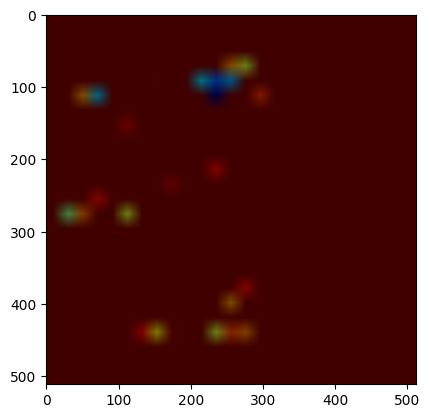

In [32]:
image_result, gradcam_map_result = explain_predictions(fasterRCNN_model, test_dataset, index_num, target_idx=2)

### Saliency Maps

In [33]:
def compute_saliency_map(image, model, target_idx, device):
    """
    Compute saliency map for a given image and target index.
    """
    image = image.to(device).unsqueeze(0).requires_grad_()
    model.zero_grad()
    outputs = model(image)
    score = outputs[0]['scores'][target_idx]
    score.backward()
    saliency = image.grad.data.abs().squeeze().max(dim=0)[0]  # Take the maximum gradient across channels
    return saliency.cpu().numpy()

def plot_explanations(original_image, gradcam_map, saliency_map, overlay_image, target_idx):
    """
    Plot the original image, Grad-CAM heatmap, saliency map, and Grad-CAM overlay.
    """
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    titles = ["Original Image", "Grad-CAM Heatmap", "Saliency Map", "Grad-CAM Overlay"]

    images = [
        original_image,
        gradcam_map,
        saliency_map,
        overlay_image
    ]

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap="jet" if title != "Original Image" else None)
        ax.set_title(title)
        ax.axis("off")

    fig.suptitle(f"Explanations for Target Index: {target_idx}", fontsize=16)
    plt.tight_layout()
    plt.show()

def explain_predictions_for_all_targets(model, images, image_index):
    """
    Explain predictions for all target indices of a given image.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    register_hooks(model)
    image, _ = images[image_index]
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = np.clip(image_np, 0, 1)

    # Move image to device
    image = image.to(device)

    outputs = model([image])
    num_targets = len(outputs[0]['scores'])

    for target_idx in range(num_targets):
        gradcam_map = compute_gradcam(image, model, target_idx, device)
        gradcam_map_resized = cv2.resize(gradcam_map, (image_np.shape[1], image_np.shape[0]))

        saliency_map = compute_saliency_map(image, model, target_idx, device)
        saliency_map_resized = cv2.resize(saliency_map, (image_np.shape[1], image_np.shape[0]))

        overlay_image = overlay_gradcam_on_image(image_np, gradcam_map_resized, alpha=0.5)

        plot_explanations(image_np, gradcam_map_resized, saliency_map_resized, overlay_image, target_idx)


In [34]:
def overlay_gradcam_on_image(original_image, gradcam_map, alpha=0.5):
    """
    Overlay the Grad-CAM heatmap on the original image with transparency.
    
    Parameters:
        original_image (numpy array): The original image in RGB format.
        gradcam_map (numpy array): The Grad-CAM heatmap.
        alpha (float): Transparency factor (0.0 to 1.0). Higher values show more of the Grad-CAM map.
    
    Returns:
        numpy array: The image with the Grad-CAM heatmap overlay.
    """
    # Normalize the Grad-CAM heatmap to range [0, 255]
    heatmap = cv2.normalize(gradcam_map, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply color map

    # Ensure the original image is in uint8 format and in range [0, 255]
    if original_image.max() <= 1.0:
        original_image = (original_image * 255).astype(np.uint8)

    # Combine the original image and heatmap using alpha blending
    overlay = cv2.addWeighted(heatmap_colored, alpha, original_image, 1 - alpha, 0)

    return overlay


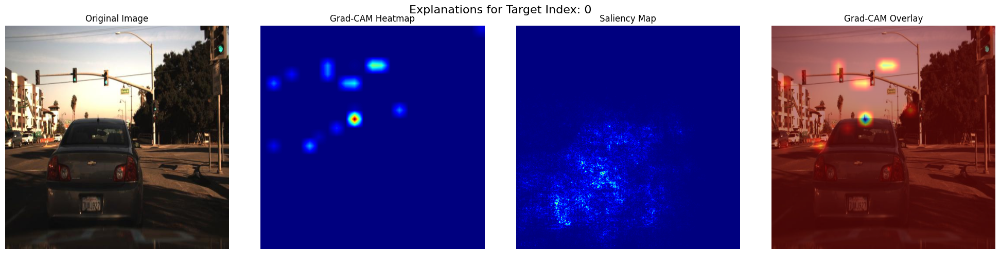

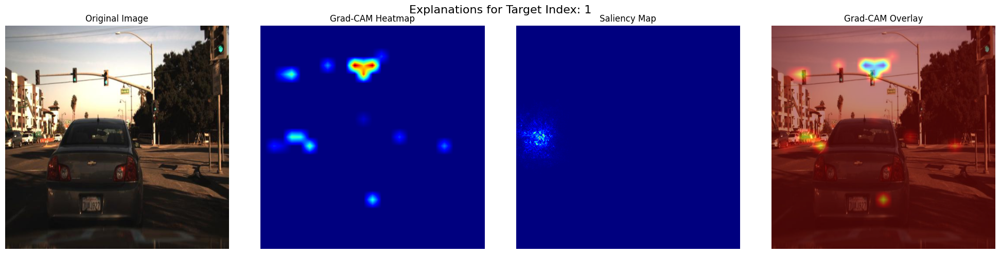

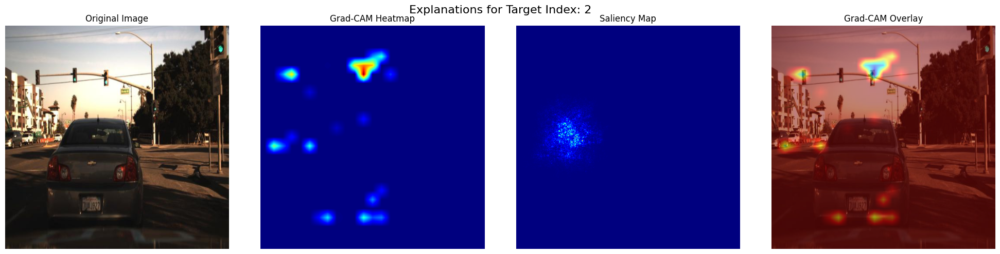

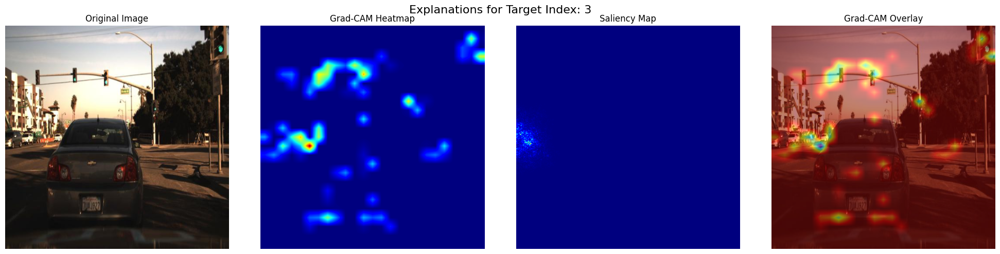

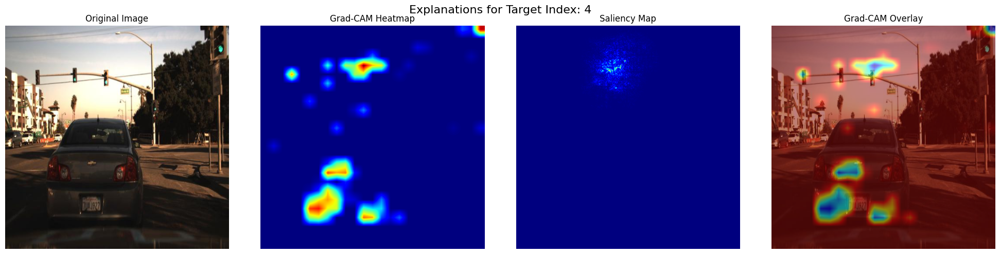

...

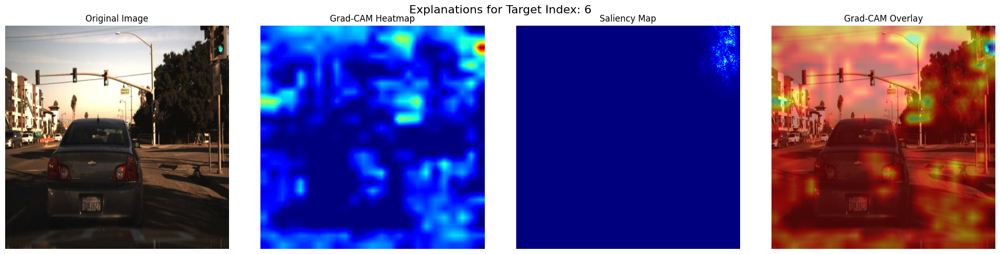

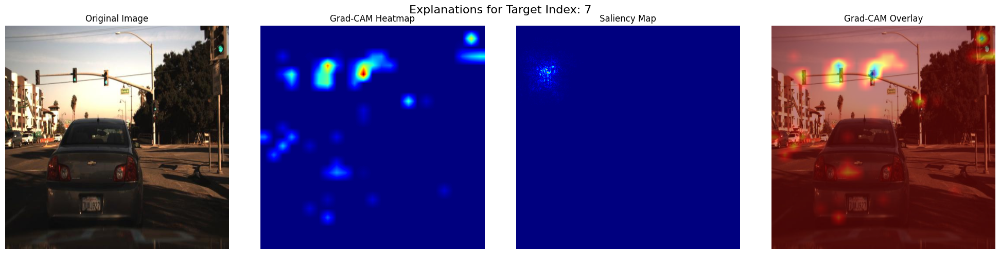

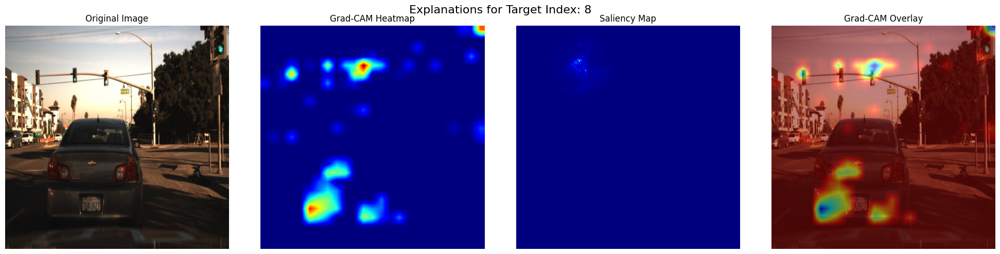

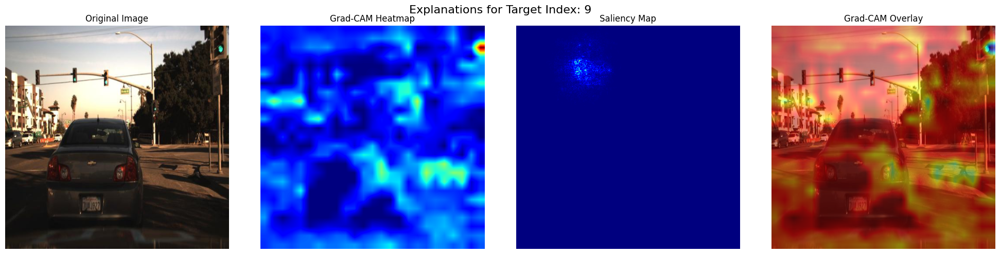

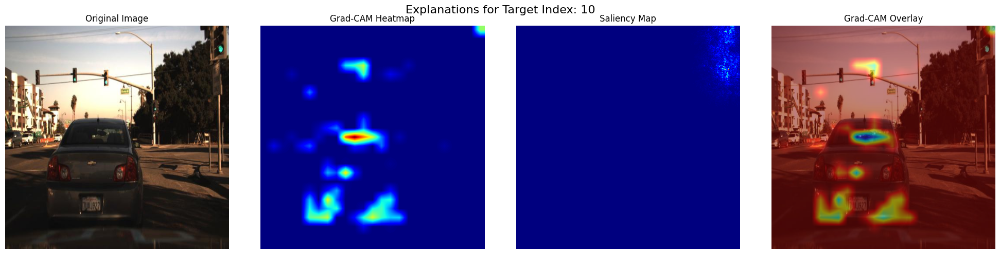

In [35]:
explain_predictions_for_all_targets(fasterRCNN_model, test_dataset, image_index=index_num)

import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch

def visualize_gradcam(model, dataset, image_index, device):
    model.eval()
    image, _ = dataset[image_index]
    image = image.to(device)
    
    # Get predictions
    with torch.no_grad():
        outputs = model([image])[0]
    
    # Extract target boxes and scores
    boxes = outputs['boxes'].cpu().numpy()
    scores = outputs['scores'].cpu().numpy()
    
    # Compute Grad-CAM for each prediction
    original_image = image.permute(1, 2, 0).cpu().numpy()
    original_image = (original_image * 255).astype(np.uint8)
    
    fig, axes = plt.subplots(1, len(scores), figsize=(20, 10))
    for i, score in enumerate(scores):
        gradcam_map = compute_gradcam(image, model, target_idx=i, device=device)
        gradcam_map = cv2.resize(gradcam_map, (original_image.shape[1], original_image.shape[0]))
        
        # Overlay Grad-CAM on original image
        heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_map), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(original_image, 0.5, heatmap, 0.5, 0)
        
        # Display the overlay with the score
        axes[i].imshow(overlay)
        axes[i].axis('off')
        axes[i].set_title(f"P={score:.5f}")
    
    plt.tight_layout()
    plt.show()

# Example Usage
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
visualize_gradcam(fasterRCNN_model, test_dataset, image_index=1000, device=device)

import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

def compute_gradcam(image, model, target_idx, device):
    """Compute Grad-CAM for a specific target index."""
    model.zero_grad()
    image = image.unsqueeze(0).to(device)  # Add batch dimension
    image.requires_grad = True
    outputs = model(image)
    
    # Extract the score of the target index (modify if your model's output format differs)
    score = outputs[0]['scores'][target_idx]
    score.backward()  # Backpropagate for the target index
    
    # Access gradients and activations of the target convolutional layer
    gradients = model.backbone.body.layer4[2].conv3.weight.grad  # Example for ResNet-based FPN
    activations = model.backbone.body.layer4[2].conv3.weight.data
    
    # Compute Grad-CAM weights and map
    weights = torch.mean(gradients, dim=(2, 3), keepdim=True)
    gradcam_map = torch.sum(weights * activations, dim=1).squeeze().cpu().detach().numpy()
    gradcam_map = np.maximum(gradcam_map, 0)  # Apply ReLU
    gradcam_map /= gradcam_map.max()  # Normalize to [0, 1]
    return gradcam_map

def overlay_gradcam_on_image(original_image, gradcam_map):
    """Overlay Grad-CAM heatmap on the original image."""
    gradcam_map_resized = cv2.resize(gradcam_map, (original_image.shape[1], original_image.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_map_resized), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(original_image, 0.6, heatmap, 0.4, 0)
    return overlay

def visualize_explanations(image_tensor, model, device, target_indices):
    """Visualize Grad-CAM outputs for multiple target indices."""
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # Convert tensor to numpy
    image_np = np.clip(image_np, 0, 1) * 255  # Normalize to [0, 255]
    original_image = np.uint8(image_np)

    fig, axes = plt.subplots(1, len(target_indices), figsize=(20, 5))
    for i, target_idx in enumerate(target_indices):
        gradcam_map = compute_gradcam(image_tensor, model, target_idx, device)
        overlay = overlay_gradcam_on_image(original_image, gradcam_map)

        axes[i].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
        axes[i].axis('off')
        axes[i].set_title(f"P={model(image_tensor.unsqueeze(0))[0]['scores'][target_idx]:.5f}")

    plt.tight_layout()
    plt.show()

# # Example Usage:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = ...  # Load your model here
# model.to(device)
# model.eval()

# Assume test_image_tensor is a single image tensor from your test dataset
test_image_tensor = ...  # Load your image tensor here (C, H, W)
target_indices = [0, 1, 2, 3, 4]  # Example target indices to visualize

visualize_explanations(test_dataset[1000][0], fasterRCNN_model, device, [i for i in range(len(test_dataset[1000][1]['labels']))])

In [29]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 64.4 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39588 sha256=aad96f951640a0343e4b8038ece360633f4693711e67747566dd63da9cdb408f
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam


In [30]:
def draw_boxes(boxes, labels, classes, image):
    for i, box in enumerate(boxes):
        color = COLORS[labels[i]]
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color, 2
        )
        cv2.putText(image, classes[i], (int(box[0]), int(box[3] - 5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2,
                    lineType=cv2.LINE_AA)
    return image

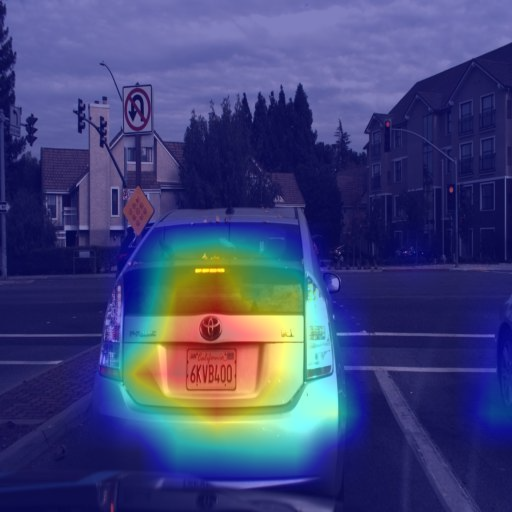

In [31]:
from pytorch_grad_cam import AblationCAM, EigenCAM
from pytorch_grad_cam.ablation_layer import AblationLayerFasterRCNN
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
# from pytorch_grad_cam.utils.reshape_transforms import fasterRCNN_reshape_transform
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image, scale_accross_batch_and_channels, scale_cam_image

index_num = 12
target_layers = [fasterRCNN_model.backbone] #.body.layer4[-1].conv3]#[fasterRCNN_model.backbone]
targets = [FasterRCNNBoxScoreTarget(labels=test_predictions[index_num]['labels'], bounding_boxes=test_predictions[index_num]['boxes'])]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cam = EigenCAM(fasterRCNN_model.to(device), target_layers, reshape_transform=fasterrcnn_reshape_transform)

input_tensor = test_dataset[index_num][0]
input_tensor = input_tensor.unsqueeze(0).to(device)

grayscale_cam = cam(input_tensor, targets=targets)
grayscale_cam = grayscale_cam[0, :]

input_tensor = input_tensor.squeeze(0).cpu().detach().numpy()  # Remove batch dimension and move to CPU
input_tensor = input_tensor.transpose(1, 2, 0)  

cam_image = show_cam_on_image(input_tensor, grayscale_cam, use_rgb=True)
# image_with_bounding_boxes = draw_boxes(boxes, labels, classes, cam_image)
Image.fromarray(cam_image)

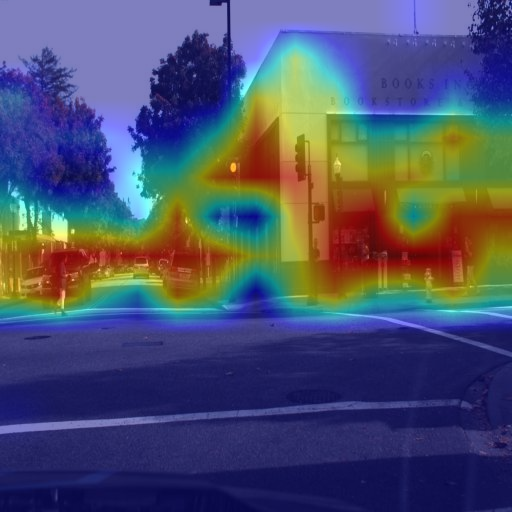

In [48]:
from pytorch_grad_cam import AblationCAM, EigenCAM
from pytorch_grad_cam.ablation_layer import AblationLayerFasterRCNN
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
# from pytorch_grad_cam.utils.reshape_transforms import fasterRCNN_reshape_transform
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image, scale_accross_batch_and_channels, scale_cam_image

index_num = 45
target_layers = [fasterRCNN_model.backbone] #.body.layer4[-1].conv3]#[fasterRCNN_model.backbone]
targets = [FasterRCNNBoxScoreTarget(labels=test_ground_truths[index_num]['labels'], bounding_boxes=test_ground_truths[index_num]['boxes'])]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cam = EigenCAM(fasterRCNN_model.to(device), target_layers, reshape_transform=fasterrcnn_reshape_transform)

input_tensor = test_dataset[index_num][0]
input_tensor = input_tensor.unsqueeze(0).to(device)

grayscale_cam = cam(input_tensor, targets=targets)
grayscale_cam = grayscale_cam[0, :]

input_tensor = input_tensor.squeeze(0).cpu().detach().numpy()  # Remove batch dimension and move to CPU
input_tensor = input_tensor.transpose(1, 2, 0)  

cam_image = show_cam_on_image(input_tensor, grayscale_cam, use_rgb=True)
# image_with_bounding_boxes = draw_boxes(boxes, labels, classes, cam_image)
Image.fromarray(cam_image)

### Final Grad CAM

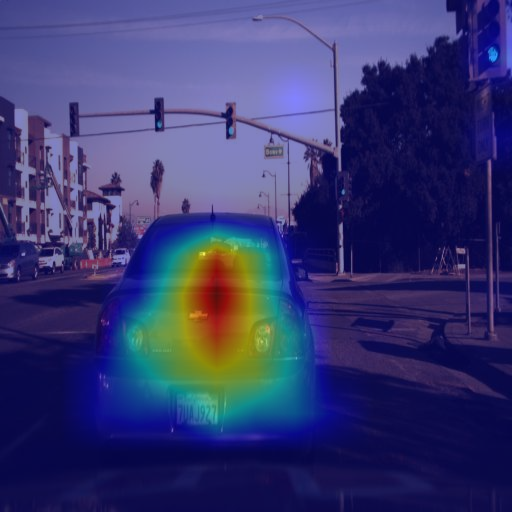

In [54]:
from pytorch_grad_cam import AblationCAM, EigenCAM
from pytorch_grad_cam.ablation_layer import AblationLayerFasterRCNN
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
# from pytorch_grad_cam.utils.reshape_transforms import fasterRCNN_reshape_transform
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image, scale_accross_batch_and_channels, scale_cam_image

index_num = 1000
target_layers = [fasterRCNN_model.backbone] #.body.layer4[-1].conv3]#[fasterRCNN_model.backbone]
targets = [FasterRCNNBoxScoreTarget(labels=test_ground_truths[index_num]['labels'], bounding_boxes=test_ground_truths[index_num]['boxes'])]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cam = EigenCAM(fasterRCNN_model.to(device), target_layers, reshape_transform=fasterrcnn_reshape_transform)

input_tensor = test_dataset[index_num][0]
input_tensor = input_tensor.unsqueeze(0).to(device)

grayscale_cam = cam(input_tensor, targets=targets)
grayscale_cam = grayscale_cam[0, :]

input_tensor = input_tensor.squeeze(0).cpu().detach().numpy()  # Remove batch dimension and move to CPU
input_tensor = input_tensor.transpose(1, 2, 0)  

cam_image = show_cam_on_image(input_tensor, grayscale_cam, use_rgb=True)
# image_with_bounding_boxes = draw_boxes(boxes, labels, classes, cam_image)
Image.fromarray(cam_image)

In [59]:
def print_grad_cam(index_num):

    # index_num = 1000
    target_layers = [fasterRCNN_model.backbone] #.body.layer4[-1].conv3]#[fasterRCNN_model.backbone]
    targets = [FasterRCNNBoxScoreTarget(labels=test_ground_truths[index_num]['labels'], bounding_boxes=test_ground_truths[index_num]['boxes'])]
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    cam = EigenCAM(fasterRCNN_model.to(device), target_layers, reshape_transform=fasterrcnn_reshape_transform)
    
    input_tensor = test_dataset[index_num][0]
    input_tensor = input_tensor.unsqueeze(0).to(device)
    
    grayscale_cam = cam(input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]
    
    input_tensor = input_tensor.squeeze(0).cpu().detach().numpy()  # Remove batch dimension and move to CPU
    input_tensor = input_tensor.transpose(1, 2, 0)  
    
    cam_image = show_cam_on_image(input_tensor, grayscale_cam, use_rgb=True)
    # image_with_bounding_boxes = draw_boxes(boxes, labels, classes, cam_image)
    Image.fromarray(cam_image)

from torchvision.ops import box_iou
from collections import defaultdict
import numpy as np

def calculate_map(model, test_loader, iou_threshold=0.5):
    """
    Calculate mean Average Precision (mAP) for a Faster R-CNN model on a test dataset.

    Parameters:
    - model: Trained Faster R-CNN model.
    - test_loader: DataLoader for the test dataset.
    - iou_threshold: IoU threshold to consider a detection as True Positive.

    Returns:
    - mAP: Mean Average Precision across all classes.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()
    
    all_detections = defaultdict(list)  # To store predictions by class
    all_ground_truths = defaultdict(list)  # To store ground truths by class

    with torch.no_grad():
        for images, targets in test_loader:
            images = [img.to(device) for img in images]
            outputs = model(images)

            for target, output in zip(targets, outputs):
                # Extract ground truth data
                gt_boxes = target['boxes'].cpu().numpy()
                gt_labels = target['labels'].cpu().numpy()

                for label, box in zip(gt_labels, gt_boxes):
                    all_ground_truths[label].append(box)

                # Extract predictions
                pred_boxes = output['boxes'].cpu().numpy()
                pred_scores = output['scores'].cpu().numpy()
                pred_labels = output['labels'].cpu().numpy()

                for label, box, score in zip(pred_labels, pred_boxes, pred_scores):
                    all_detections[label].append((box, score))

    # Calculate AP for each class
    ap_per_class = {}
    for class_id in set(all_ground_truths.keys()).union(all_detections.keys()):
        ap_per_class[class_id] = calculate_ap(
            all_detections[class_id], all_ground_truths[class_id], iou_threshold
        )

    # Calculate mAP
    mAP = np.mean(list(ap_per_class.values()))
    return mAP, ap_per_class


def calculate_ap(predictions, ground_truths, iou_threshold=0.5):
    """
    Calculate Average Precision (AP) for a single class.

    Parameters:
    - predictions: List of (box, score) tuples for predictions.
    - ground_truths: List of ground truth boxes.
    - iou_threshold: IoU threshold to consider a detection as True Positive.

    Returns:
    - AP: Average Precision for the class.
    """
    # Sort predictions by confidence score in descending order
    predictions = sorted(predictions, key=lambda x: x[1], reverse=True)

    true_positives = []
    false_positives = []

    detected_gt_indices = set()  # To track matched ground truth boxes

    for pred_box, _ in predictions:
        if len(ground_truths) == 0:
            false_positives.append(1)
            true_positives.append(0)
            continue

        # Compute IoU with all ground truths
        ious = box_iou(torch.tensor([pred_box]), torch.tensor(ground_truths)).squeeze().numpy()

        # Match prediction to the highest IoU above the threshold
        best_iou_idx = np.argmax(ious)
        if ious[best_iou_idx] >= iou_threshold and best_iou_idx not in detected_gt_indices:
            true_positives.append(1)
            false_positives.append(0)
            detected_gt_indices.add(best_iou_idx)
        else:
            false_positives.append(1)
            true_positives.append(0)

    # Convert to cumulative sums for precision-recall calculation
    true_positives = np.cumsum(true_positives)
    false_positives = np.cumsum(false_positives)

    precision = true_positives / (true_positives + false_positives + 1e-6)
    recall = true_positives / len(ground_truths)

    # Integrate Precision-Recall curve to compute AP
    recall = np.concatenate([[0], recall, [1]])
    precision = np.concatenate([[0], precision, [0]])
    for i in range(len(precision) - 1, 0, -1):
        precision[i - 1] = max(precision[i - 1], precision[i])

    ap = np.sum((recall[1:] - recall[:-1]) * precision[1:])
    return ap


mAP, ap_per_class = calculate_map(fasterRCNN_model, test_dataset)
print("mAP:", mAP)
for class_id, ap in ap_per_class.items():
    print(f"Class {class_id} AP: {ap}")

In [37]:
from collections import defaultdict
import numpy as np
from tqdm import tqdm

def calculate_iou(box1, box2):
    """
    Calculate the Intersection over Union (IoU) of two boxes.
    Each box is defined as [x1, y1, x2, y2].
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area > 0 else 0

def calculate_ap(pred_boxes, pred_scores, pred_labels, gt_boxes, gt_labels, iou_threshold=0.5):
    """
    Calculate Average Precision (AP) for a single class.
    """
    sorted_indices = np.argsort(-pred_scores)  # Sort by score descending
    pred_boxes = pred_boxes[sorted_indices]
    pred_labels = pred_labels[sorted_indices]

    tp = np.zeros(len(pred_boxes))
    fp = np.zeros(len(pred_boxes))

    matched = set()  # Track matched ground truth boxes

    for i, pred_box in enumerate(pred_boxes):
        if pred_labels[i] not in gt_labels:
            fp[i] = 1
            continue

        max_iou = 0
        max_gt_idx = -1

        for j, gt_box in enumerate(gt_boxes):
            if j in matched or gt_labels[j] != pred_labels[i]:
                continue

            iou = calculate_iou(pred_box, gt_box)
            if iou > max_iou:
                max_iou = iou
                max_gt_idx = j

        if max_iou >= iou_threshold:
            tp[i] = 1
            matched.add(max_gt_idx)
        else:
            fp[i] = 1

    # Calculate precision and recall
    tp_cumsum = np.cumsum(tp)
    fp_cumsum = np.cumsum(fp)
    precision = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-6)
    recall = tp_cumsum / len(gt_boxes)

    # Calculate AP as the area under the precision-recall curve
    ap = np.trapz(precision, recall)
    return ap

def calculate_map(test_predictions, test_ground_truth, iou_threshold=0.5):
    """
    Calculate mAP and AP for all classes.
    """
    all_detections = defaultdict(list)
    all_ground_truths = defaultdict(list)

    for pred, gt in tqdm(zip(test_predictions, test_ground_truth)):
        # Append detections
        for label, box, score in zip(pred['labels'], pred['boxes'], pred['scores']):
            all_detections[label].append((box, score))

        # Append ground truths
        for label, box in zip(gt['labels'], gt['boxes']):
            all_ground_truths[label].append(box)

    print('lists created')

    ap_per_class = {}
    for class_id in tqdm(set(all_ground_truths.keys()).union(all_detections.keys())):
        print(class_id)
        pred_boxes = np.array([d[0] for d in all_detections[class_id]])
        pred_scores = np.array([d[1] for d in all_detections[class_id]])
        pred_labels = np.full(len(pred_boxes), class_id)
        print(len(pred_labels))
        gt_boxes = np.array(all_ground_truths[class_id])
        gt_labels = np.full(len(gt_boxes), class_id)
        print(gt_labels)

        ap_per_class[class_id] = calculate_ap(
            pred_boxes, pred_scores, pred_labels, gt_boxes, gt_labels, iou_threshold
        )
        print(ap_per_class[class_id])
        print()

    # Mean Average Precision (mAP)
    mAP = np.mean(list(ap_per_class.values()))
    return mAP, ap_per_class


In [38]:
mAP, ap_per_class = calculate_map(test_predictions, test_ground_truths)

print("Mean Average Precision (mAP):", mAP)
for class_id, ap in ap_per_class.items():
    print(f"Class {class_id} AP: {ap}")

6000it [00:00, 108164.27it/s]


lists created


  0%|          | 0/11 [00:00<?, ?it/s]

1
661
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 

  9%|▉         | 1/11 [00:02<00:23,  2.33s/it]

0.8025406524578019

2
24091
[2 2 2 ... 2 2 2]


 18%|█▊        | 2/11 [50:59<4:29:51, 1799.07s/it]

0.9147473491774809

3
4079
[3 3 3 ... 3 3 3]


 27%|██▋       | 3/11 [52:20<2:15:16, 1014.57s/it]

0.8752738751523974

4
968
[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4

 36%|███▋      | 4/11 [52:24<1:11:50, 615.82s/it] 

0.9115260397211344

5
1852
[5 5 5 ... 5 5 5]


 55%|█████▍    | 6/11 [52:45<22:04, 264.82s/it]  

0.7975329661421084

6
124
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
0.8767523569503393

7
2568
[7 7 7 ... 7 7 7]


 64%|██████▎   | 7/11 [53:20<12:38, 189.70s/it]

0.8516818165577961

8
620
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8

 73%|███████▎  | 8/11 [53:22<06:30, 130.03s/it]

0.8195530871445462

9
99
[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
0.7751891033236347

10
3
[10 10 10 10 10 10 10 10 10 10]
0.19999988333341384

11
1408
[11 11 11 ... 11 11 11]


100%|██████████| 11/11 [53:32<00:00, 292.06s/it]

0.9115318033553627

Mean Average Precision (mAP): 0.794211721210547
Class 1 AP: 0.8025406524578019
Class 2 AP: 0.9147473491774809
Class 3 AP: 0.8752738751523974
Class 4 AP: 0.9115260397211344
Class 5 AP: 0.7975329661421084
Class 6 AP: 0.8767523569503393
Class 7 AP: 0.8516818165577961
Class 8 AP: 0.8195530871445462
Class 9 AP: 0.7751891033236347
Class 10 AP: 0.19999988333341384
Class 11 AP: 0.9115318033553627


In [39]:
category_dict

{0: 'obstacles',
 1: 'biker',
 2: 'car',
 3: 'pedestrian',
 4: 'trafficLight',
 5: 'trafficLight-Green',
 6: 'trafficLight-GreenLeft',
 7: 'trafficLight-Red',
 8: 'trafficLight-RedLeft',
 9: 'trafficLight-Yellow',
 10: 'trafficLight-YellowLeft',
 11: 'truck'}

In [45]:
all_detections = defaultdict(list)
all_ground_truths = defaultdict(list)

for pred, gt in tqdm(zip(test_predictions, test_ground_truths)):
    for label, box, score in zip(pred['labels'], pred['boxes'], pred['scores']):
        all_detections[label].append((box, score))
    for label, box in zip(gt['labels'], gt['boxes']):
        all_ground_truths[label].append(box)

print('lists created')

class_dict = {}
for class_id in tqdm(set(all_ground_truths.keys()).union(all_detections.keys())):
    pred_boxes = np.array([d[0] for d in all_detections[class_id]])
    pred_scores = np.array([d[1] for d in all_detections[class_id]])
    pred_labels = np.full(len(pred_boxes), class_id)
    gt_boxes = np.array(all_ground_truths[class_id])
    gt_labels = np.full(len(gt_boxes), class_id)
    pred_gt_dict = {}
    pred_gt_dict['num_pred_labels'] = len(pred_labels)
    pred_gt_dict['num_gt_labels'] = len(gt_labels)
    class_dict[f'{class_id}'] = pred_gt_dict

6000it [00:00, 100418.28it/s]


lists created


100%|██████████| 11/11 [00:00<00:00, 313.10it/s]


In [55]:
import numpy as np
from collections import defaultdict
from tqdm import tqdm

class_dict = {}
for class_id in tqdm(set(all_ground_truths.keys()).union(all_detections.keys())):
    pred_image_indices = []
    gt_image_indices = []
    for img_idx, (pred, gt) in enumerate(zip(test_predictions, test_ground_truths)):
        if class_id in pred['labels']:
            pred_image_indices.append(img_idx)
        if class_id in gt['labels']:
            gt_image_indices.append(img_idx)
    pred_gt_dict = {}
    pred_gt_dict['num_pred_images'] = len(pred_image_indices)
    pred_gt_dict['num_gt_images'] = len(gt_image_indices)
    pred_gt_dict['pred_image_indices'] = pred_image_indices
    pred_gt_dict['gt_image_indices'] = gt_image_indices
    
    class_dict[str(class_id)] = pred_gt_dict
# print(class_dict)

100%|██████████| 11/11 [00:00<00:00, 25.27it/s]


In [69]:
random.choice(class_dict['10']['pred_image_indices'])

4379

In [78]:
class_dict['11']['gt_image_indices']

[2,
 3,
 15,
 16,
 17,
 24,
 31,
 37,
 41,
 42,
 45,
 48,
 57,
 65,
 79,
 93,
 94,
 96,
 99,
 102,
 127,
 128,
 130,
 138,
 146,
 167,
 173,
 182,
 204,
 206,
 212,
 218,
 221,
 226,
 227,
 229,
 251,
 254,
 256,
 268,
 272,
 275,
 276,
 286,
 294,
 305,
 316,
 330,
 339,
 343,
 344,
 349,
 350,
 360,
 362,
 374,
 375,
 378,
 379,
 380,
 383,
 388,
 392,
 412,
 417,
 434,
 438,
 454,
 456,
 463,
 470,
 477,
 481,
 484,
 488,
 492,
 501,
 508,
 513,
 517,
 528,
 548,
 561,
 564,
 570,
 571,
 572,
 586,
 591,
 599,
 607,
 618,
 620,
 622,
 626,
 627,
 631,
 644,
 645,
 664,
 666,
 677,
 679,
 680,
 685,
 687,
 694,
 701,
 707,
 710,
 719,
 725,
 727,
 736,
 737,
 751,
 754,
 780,
 783,
 785,
 789,
 790,
 794,
 801,
 805,
 810,
 821,
 824,
 828,
 831,
 849,
 858,
 859,
 863,
 871,
 872,
 873,
 875,
 881,
 884,
 901,
 902,
 927,
 928,
 931,
 938,
 941,
 945,
 958,
 962,
 963,
 969,
 976,
 977,
 981,
 1002,
 1004,
 1011,
 1019,
 1022,
 1031,
 1046,
 1050,
 1063,
 1065,
 1102,
 1103,
 1106,


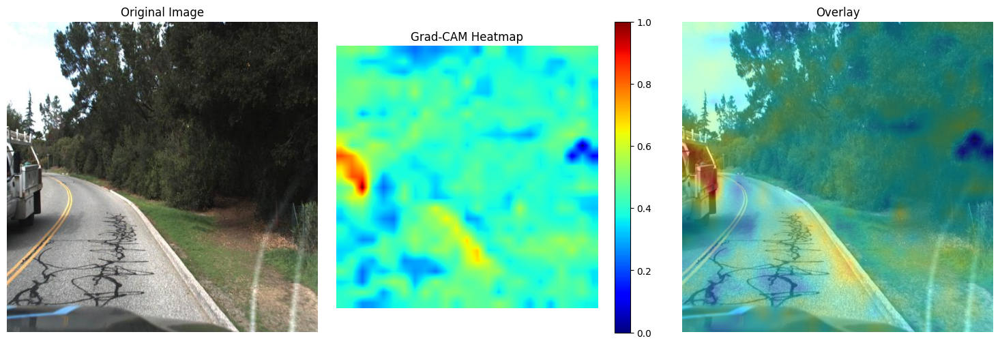

In [81]:
index_num = 3782
sample_image, groundtruth = test_dataset.__getitem__(index_num)
sample_image = torch.unsqueeze(sample_image, 0)  # Add batch dimension
sample_image = sample_image.to(device)
sample_image = sample_image.squeeze(0).cpu().permute(1, 2, 0).numpy()#sample_image.squeeze(0).permute(1, 2, 0).numpy()
groundtruth_boxes = test_dataset.__getitem__(index_num)[1]["boxes"]
boxes = test_predictions[index_num]['boxes']
image = test_dataset.__getitem__(index_num)[0] #Image.open(image_path).convert("RGB")
image_tensor = image.unsqueeze(0)

visualize_grad_cam_with_overlay(fasterRCNN_model, image_tensor[0])

In [72]:
category_dict

{0: 'obstacles',
 1: 'biker',
 2: 'car',
 3: 'pedestrian',
 4: 'trafficLight',
 5: 'trafficLight-Green',
 6: 'trafficLight-GreenLeft',
 7: 'trafficLight-Red',
 8: 'trafficLight-RedLeft',
 9: 'trafficLight-Yellow',
 10: 'trafficLight-YellowLeft',
 11: 'truck'}

In [75]:
import random

indices_to_print = []
class_label_of_indices = [] 
for i in range(1,12):
    index_to_print = random.choice(class_dict[f'{i}']['gt_image_indices'])
    indices_to_print.append(index_to_print)
    class_label_of_indices.append(i)

In [80]:
indices_to_print

[3079, 5622, 5764, 2210, 5764, 4255, 3241, 22, 2692, 4379, 3782]

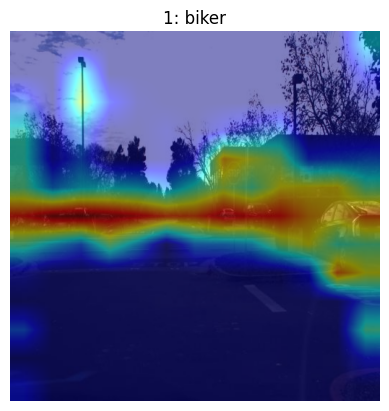

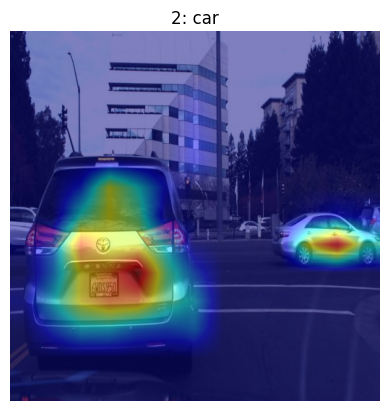

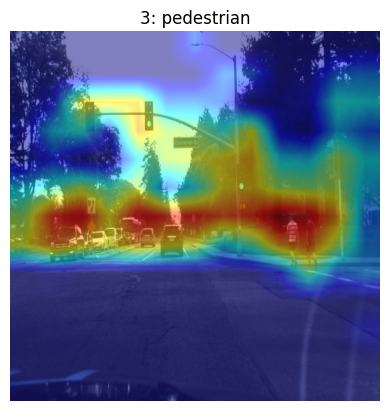

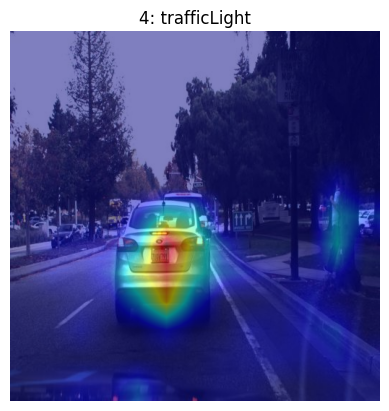

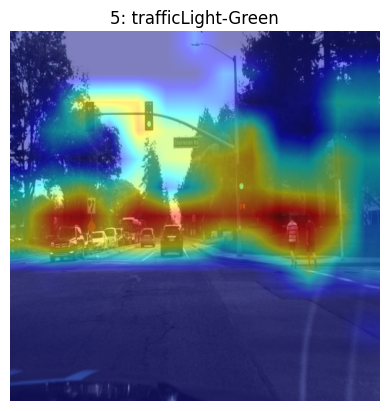

...

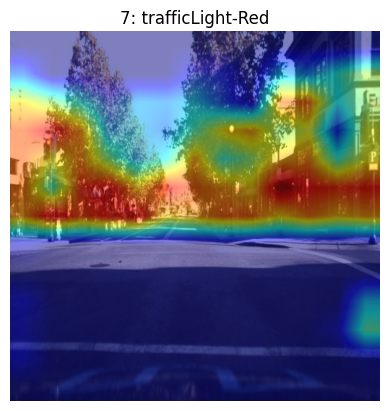

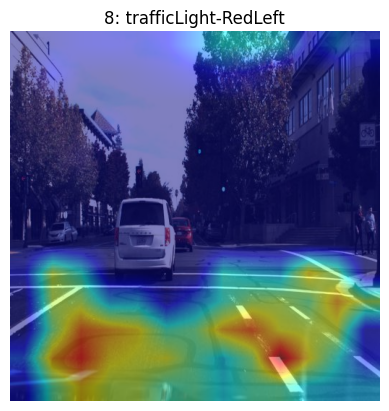

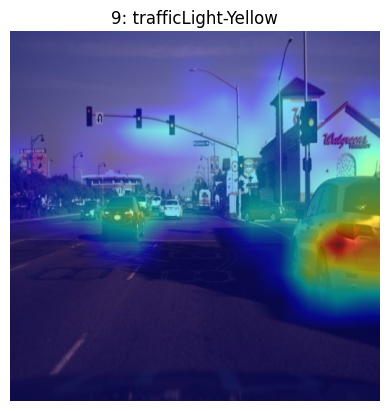

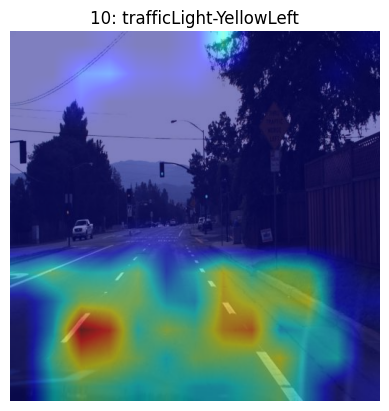

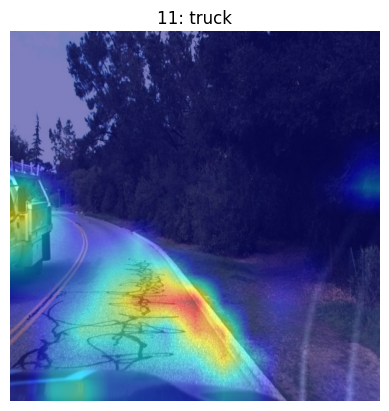

In [76]:
for index_num, class_index in zip(indices_to_print, class_label_of_indices):

    target_layers = [fasterRCNN_model.backbone] #.body.layer4[-1].conv3]#[fasterRCNN_model.backbone]
    targets = [FasterRCNNBoxScoreTarget(labels=test_ground_truths[index_num]['labels'], bounding_boxes=test_ground_truths[index_num]['boxes'])]
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    cam = EigenCAM(fasterRCNN_model.to(device), target_layers, reshape_transform=fasterrcnn_reshape_transform)
    
    input_tensor = test_dataset[index_num][0]
    input_tensor = input_tensor.unsqueeze(0).to(device)
    
    grayscale_cam = cam(input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]
    
    input_tensor = input_tensor.squeeze(0).cpu().detach().numpy()  # Remove batch dimension and move to CPU
    input_tensor = input_tensor.transpose(1, 2, 0)  
    
    cam_image = show_cam_on_image(input_tensor, grayscale_cam, use_rgb=True)
    # image_with_bounding_boxes = draw_boxes(boxes, labels, classes, cam_image)
    Image.fromarray(cam_image)
    plt.title(f'{class_index}: {category_dict[class_index]}')
    plt.imshow(cam_image)
    plt.axis('off')  # Turn off axes
    plt.show() 

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Number of columns in the subplot grid
num_columns = 6
# Calculate the number of rows needed
num_rows = (len(indices_to_print) + num_columns - 1) // num_columns  # This rounds up to the nearest integer

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, num_rows * 3))  # Adjust figsize as needed

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop over your indices and corresponding class labels
for i, (index_num, class_index) in enumerate(zip(indices_to_print, class_label_of_indices)):
    target_layers = [fasterRCNN_model.backbone]  # .body.layer4[-1].conv3]#[fasterRCNN_model.backbone]
    targets = [FasterRCNNBoxScoreTarget(labels=test_ground_truths[index_num]['labels'],
                                         bounding_boxes=test_ground_truths[index_num]['boxes'])]

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    cam = EigenCAM(fasterRCNN_model.to(device), target_layers, reshape_transform=fasterrcnn_reshape_transform)

    input_tensor = test_dataset[index_num][0]
    input_tensor = input_tensor.unsqueeze(0).to(device)

    grayscale_cam = cam(input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]

    input_tensor = input_tensor.squeeze(0).cpu().detach().numpy()  # Remove batch dimension and move to CPU
    input_tensor = input_tensor.transpose(1, 2, 0)  # Convert to HxWxC format for visualization

    cam_image = show_cam_on_image(input_tensor, grayscale_cam, use_rgb=True)

    # Use subplot to display each image in the correct position
    ax = axes[i]
    ax.imshow(cam_image)
    ax.axis('off')  # Turn off axes

    # Add a title for each subplot
    ax.set_title(f'{class_index}: {category_dict[class_index]}')

# Hide any empty subplots if the number of images is not a perfect multiple of 6
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

In [ ]:
a

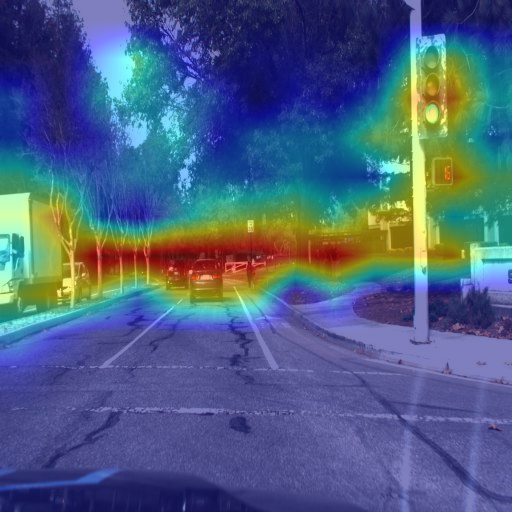

In [66]:
# index_num = 1000
target_layers = [fasterRCNN_model.backbone] #.body.layer4[-1].conv3]#[fasterRCNN_model.backbone]
targets = [FasterRCNNBoxScoreTarget(labels=test_ground_truths[index_num]['labels'], bounding_boxes=test_ground_truths[index_num]['boxes'])]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cam = EigenCAM(fasterRCNN_model.to(device), target_layers, reshape_transform=fasterrcnn_reshape_transform)

input_tensor = test_dataset[index_num][0]
input_tensor = input_tensor.unsqueeze(0).to(device)

grayscale_cam = cam(input_tensor, targets=targets)
grayscale_cam = grayscale_cam[0, :]

input_tensor = input_tensor.squeeze(0).cpu().detach().numpy()  # Remove batch dimension and move to CPU
input_tensor = input_tensor.transpose(1, 2, 0)  

cam_image = show_cam_on_image(input_tensor, grayscale_cam, use_rgb=True)
# image_with_bounding_boxes = draw_boxes(boxes, labels, classes, cam_image)
Image.fromarray(cam_image)

In [50]:
import torch
from PIL import Image
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Grad-CAM initialization
target_layers = [fasterRCNN_model.backbone]
cam = EigenCAM(fasterRCNN_model.to(device), target_layers, reshape_transform=fasterrcnn_reshape_transform)

class_index_checklist = []
expected_class_index_checklist = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
# Iterate through the test dataset
for index_num in range(len(test_dataset)):  # Iterate through all test images
    input_tensor = test_dataset[index_num][0].unsqueeze(0).to(device)  # Prepare the image tensor
    input_image = test_dataset[index_num][0].cpu().numpy()  # Convert to CPU for visualization
    input_image = input_image.transpose(1, 2, 0)  # HWC format for visualization

    # Get ground truth labels and bounding boxes for the current image
    ground_truths = test_ground_truths[index_num]
    labels = ground_truths['labels']
    boxes = ground_truths['boxes']

    if all(element in class_index_checklist for element in expected_class_index_checklist):
        break
    
    # Iterate through all 12 classes
    for class_index in range(1, 13): 
        if class_index not in class_index_checklist:
            # Check if the class is present in the ground truth
            if class_index in labels:
                # Set the targets for Grad-CAM
                targets = [FasterRCNNBoxScoreTarget(labels=[class_index], bounding_boxes=boxes)]
    
                # Compute Grad-CAM
                grayscale_cam = cam(input_tensor, targets=targets)
                grayscale_cam = grayscale_cam[0, :]  # Extract the first (and only) CAM
    
                # Generate the Grad-CAM visualization
                cam_image = show_cam_on_image(input_image, grayscale_cam, use_rgb=True)

                print(class_index)
                # Save or display the Grad-CAM image
                #save_path = f"grad_cam_images/image_{index_num}_class_{class_index}.png"
                Image.fromarray(cam_image) #.save(save_path)
        

    print(f"Processed image {index_num}/{len(test_dataset)}")

2
7
Processed image 0/6000
2
Processed image 1/6000
2
3
5
11
Processed image 2/6000
2
4
5
11
Processed image 3/6000
2
Processed image 4/6000
2
Processed image 5/6000
2
3
Processed image 6/6000
Processed image 7/6000
2
6
Processed image 8/6000
2
3
Processed image 9/6000
2
3
Processed image 10/6000
2
Processed image 11/6000
2
7
Processed image 12/6000
1
2
3
Processed image 13/6000
2
Processed image 14/6000
2
4
5
6
11
Processed image 15/6000
2
7
11
Processed image 16/6000
2
5
8
11
Processed image 17/6000
2
Processed image 18/6000
2
Processed image 19/6000
2
Processed image 20/6000
2
3
7
8
Processed image 21/6000
2
3
4
5
8
Processed image 22/6000
2
3
7
Processed image 23/6000
2
11
Processed image 24/6000
2
4
5
Processed image 25/6000


KeyboardInterrupt: 

In [57]:
class_index_checklist

[]

In [ ]:
def compute_saliency_map(image, model, target_idx, device):
    image = image.to(device).unsqueeze(0).requires_grad_()
    model.zero_grad()
    outputs = model(image)
    score = outputs[0]['scores'][target_idx]
    score.backward()
    saliency = image.grad.data.abs().squeeze().max(dim=0)[0]  # Take the maximum gradient across channels
    return saliency.cpu().numpy()

def explain_predictions_for_all_targets(model, images, image_index):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    register_hooks(model)
    image, _ = images[image_index]
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = np.clip(image_np, 0, 1)
    image = image.to(device)

    outputs = model([image])
    num_targets = len(outputs[0]['scores'])

    for target_idx in range(num_targets):
        gradcam_map = compute_gradcam(image, model, target_idx, device)
        gradcam_map_resized = cv2.resize(gradcam_map, (image_np.shape[1], image_np.shape[0]))

        saliency_map = compute_saliency_map(image, model, target_idx, device)
        saliency_map_resized = cv2.resize(saliency_map, (image_np.shape[1], image_np.shape[0]))

        overlay_image = overlay_gradcam_on_image(image_np, gradcam_map_resized, alpha=0.5)

        plot_explanations(image_np, gradcam_map_resized, saliency_map_resized, overlay_image, target_idx)
